- unstructured: Parse multiple documents
- unstructured-inference: same
- pytesseract: OCR package
- onnx: framework (and format) to handle different types of ML models and convert them from one framework format to another
- python-poppler: pdf rendering library (note: for the install to work, poppler should be installed on the computer, for ex for mac: brew install poppler)

In [ ]:
from dotenv import load_dotenv

load_dotenv()

In [78]:
%pip install unstructured unstructured-inference onnx pytesseract python-poppler chromadb

Note: you may need to restart the kernel to use updated packages.


In [79]:
%pip install langchain openai langchain-core langchain-community langchain-openai tqdm jq unstructured pypdf

Note: you may need to restart the kernel to use updated packages.


## Multi-vector retriever

As opposed to the single-vector retriever where one data sample is represented with one vector, in mult-vector retriever, one data sample can be represented with several embedding vectors. This approach enhances the retrieval performance by capturing more nuanced or diverse aspects of the document's content, leading to more accurate results in tasks such as semantic search.

### Example with a pdf file

In [80]:
from langchain.document_loaders import PyPDFLoader
from langchain.text_splitter import RecursiveCharacterTextSplitter

file_path = "/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf"

loader = PyPDFLoader(file_path=file_path)

text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=10000,  # chunks of 10000 characters
    chunk_overlap=0
)

data = loader.load_and_split(text_splitter=text_splitter)
data

[Document(metadata={'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf', 'page': 0}, page_content='Springer Series in Statistics\nTrevor Hastie\nRobert TibshiraniJerome FriedmanSpringer Series in Statistics\nThe Elements of\nStatistical Learning\nData Mining, Inference, and Prediction\nThe Elements of Statistical LearningDuring the past decade there has been an explosion in computation and information tech-\nnology. With it have come vast amounts of data in a variety of fields such as medicine, biolo-gy, finance, and marketing. The challenge of understanding these data has led to the devel-opment of new tools in the field of statistics, and spawned new areas such as data mining,machine learning, and bioinformatics. Many of these tools have common underpinnings butare often expressed with different terminology. This book describes the important ideas inthese areas in a common conceptual framework. While the appro

In [ ]:
from langchain.vectorstores import Chroma
from langchain.storage import InMemoryStore
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain.retrievers.multi_vector import MultiVectorRetriever

import os

os.environ["OPENAI_API_KEY"] = os.getenv("OPENAI_API_KEY")

vectorstore = Chroma(
    collection_name="statistical_learning",
    embedding_function=OpenAIEmbeddings()
)  # store for embedding vectors

store = InMemoryStore()  # store for initial data
id_key = "doc_id"  # key to map vector store to data store

retriever = MultiVectorRetriever(
    vectorstore=vectorstore,
    docstore=store,
    id_key=id_key
)

retriever

MultiVectorRetriever(vectorstore=<langchain_community.vectorstores.chroma.Chroma object at 0x393343460>, docstore=<langchain_core.stores.InMemoryStore object at 0x327d31850>, search_kwargs={})

uuid: package to generate 128-bit unique id.

In [82]:
import uuid

doc_ids = [str(uuid.uuid4()) for _ in data]
doc_ids

['8dacdf74-680c-4dba-a9fa-6da7e877ae5f',
 '862d8963-11b8-4816-9d30-07714cc74245',
 '1bfffaf2-31a6-48a3-8d46-de7088eb64f7',
 '00c7e95b-c984-495b-ad97-9d7542599f8e',
 'e7ee62ec-c6dd-43b0-adc0-b56b7b997bc8',
 '15a2642c-ac4f-4d9f-bf62-0d31c80d9dc6',
 '95289564-46e8-489a-add8-c3c9ee923641',
 'd6e8156e-22fd-4a3f-bee7-7901f2268921',
 '014b7a4e-2ac0-47c5-869d-fb22126c77f5',
 'fe00248c-b03d-481d-8308-f593813b27ab',
 'b3ad2e53-88cd-4ec8-beb0-ac4d2461ff20',
 '74915e43-592d-4ea1-abc0-f659f7e6ba41',
 'f87f7116-12aa-4630-b708-7cc74b3e11c3',
 '7b22794d-26f9-4072-8b17-5095450214bc',
 'ac5ae7f8-78f9-40dc-bb79-f7d91fef480f',
 'ff0ca570-a473-4082-8f3a-ee5d1564df61',
 '90060aa2-980e-4583-bc20-50751bce63f8',
 'd15763c5-4b28-4484-8673-9e49d414667a',
 'f3cd9246-0b30-487d-8e74-d6b264d7e426',
 'a36c1958-7f34-4c93-a3e9-9a6abe4a64ca',
 '3d31c59f-65cd-4038-9870-f4739baadc5c',
 '77cc8318-c18d-40ee-a887-48d714c34560',
 '866525df-ba46-448f-ad23-1f4d21047c1d',
 '30cd417d-fa0f-4f70-83af-7a0ccadee26c',
 'cef5c5b9-1b1f-

Note that here, as we created documents of 10000 characters each, it's not relevant to store one vector for each document, as they contain too much information. Instead, we will partition each document into smaller documents, then index each sub document separately.

In the following code, we make sure each sub-document extracted from a same initial document has the same doc_id key.

In [83]:
child_text_splitter = RecursiveCharacterTextSplitter(chunk_size=400, chunk_overlap=0)

all_sub_docs = []
for i, doc in enumerate(data):
    doc_id = doc_ids[i]
    sub_docs = child_text_splitter.split_documents([doc])
    for sub_doc in sub_docs:
        sub_doc.metadata[id_key] = doc_id  # storing the original id of each sub document created for a given document
    all_sub_docs.extend(sub_docs)

all_sub_docs

[Document(metadata={'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf', 'page': 0, 'doc_id': '8dacdf74-680c-4dba-a9fa-6da7e877ae5f'}, page_content='Springer Series in Statistics\nTrevor Hastie\nRobert TibshiraniJerome FriedmanSpringer Series in Statistics\nThe Elements of\nStatistical Learning\nData Mining, Inference, and Prediction\nThe Elements of Statistical LearningDuring the past decade there has been an explosion in computation and information tech-'),
 Document(metadata={'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf', 'page': 0, 'doc_id': '8dacdf74-680c-4dba-a9fa-6da7e877ae5f'}, page_content='nology. With it have come vast amounts of data in a variety of fields such as medicine, biolo-gy, finance, and marketing. The challenge of understanding these data has led to the devel-opment of new tools in the field of statistics, and 

In [84]:
retriever.vectorstore.add_documents(all_sub_docs)  # all sub documents indexed using OpenAIEmbeddings
retriever.docstore.mset(list(zip(doc_ids, data)))  # mset: equivalent of add_documents for doc store, contains the initial documents
# the two are mapped through the doc_ids

Let's do an ANN search using the embedding vectors.

In [85]:
retriever.vectorstore.similarity_search("Linear regression")

[Document(metadata={'doc_id': '92a76915-95c5-499a-928c-af548e45db81', 'page': 118, 'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf'}, page_content='100 3. Linear Methods for Regression'),
 Document(metadata={'doc_id': 'bb1a5e22-7c95-41c1-bb28-49231798e93c', 'page': 31, 'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf'}, page_content='2.3 Least Squares and Nearest Neighbors 13\nLinear Regression of 0/1 Response'),
 Document(metadata={'doc_id': '697e1d0c-d0b3-48c9-8df5-8a6ce56e5bb8', 'page': 223, 'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf'}, page_content='linear model to one that is locally linear.'),
 Document(metadata={'doc_id': 'a37b3612-4b3c-43c5-9b51-624af330e00d', 'page': 72, 'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Docum

We observe that the different sub documents are very short, we won't get a lot of information using them.

In [9]:
retriever.get_relevant_documents("Linear regression")

/var/folders/dv/3f3b4khs1ydgzbm5tkl2ccw80000gn/T/ipykernel_48741/3841897739.py:1: LangChainDeprecationWarning: The method `BaseRetriever.get_relevant_documents` was deprecated in langchain-core 0.1.46 and will be removed in 1.0. Use :meth:`~invoke` instead.
  retriever.get_relevant_documents("Linear regression")


[Document(metadata={'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf', 'page': 118}, page_content='100 3. Linear Methods for Regression'),
 Document(metadata={'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf', 'page': 31}, page_content='2.3 Least Squares and Nearest Neighbors 13\nLinear Regression of 0/1 Response\n.. . . . . .. . . . . . . . . . . .. . . . . . . . . . . . . . . . .. . . . . . . . . . . . . . . . . . . . . . .. . . . . . . . . . . . . . . . . . . . . . . . . . . .. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .. . . . . . . . . . . . . . . 

This method uses a comparison between the actual data (docstore), and not the indexed data (vectorstore, i.e. embeddings) that is used to retrieve the data. The output documents are much longer, which helps more to find a good answer.

In [86]:
from langchain.chains import RetrievalQA
from langchain_openai import ChatOpenAI
from langchain.callbacks import StdOutCallbackHandler

llm = ChatOpenAI(temperature=0)  # deterministic

chain = RetrievalQA.from_chain_type(
    llm=llm,
    retriever=retriever,
    verbose=True
)

chain.run('What is linear regression?')



> Entering new RetrievalQA chain...

> Finished chain.


'Linear regression is a statistical method used to model the relationship between a dependent variable and one or more independent variables. In linear regression, the relationship is assumed to be linear, meaning that the dependent variable can be estimated as a linear combination of the independent variables. The goal of linear regression is to find the best-fitting line that describes the relationship between the variables by minimizing the sum of the squared differences between the observed values and the values predicted by the model.'

## Indexing vectors with questions

In [87]:
from langchain.chains import LLMChain
from langchain.output_parsers import NumberedListOutputParser

prompt = """
Generate a numbered list of 3 hypothetical questions that the below document could be used to answer.

{doc}
"""

#llm = ChatOpenAI(temperature=0, model_name='gpt-3.5-turbo-16k')
llm = ChatOpenAI(temperature=0, model_name='gpt-3.5-turbo')

chain = LLMChain.from_string(
    llm=llm,
    template=prompt
)

chain.verbose = True
chain.output_parser = NumberedListOutputParser()

chain.run(data[20].page_content)



> Entering new LLMChain chain...
Prompt after formatting:

Generate a numbered list of 3 hypothetical questions that the below document could be used to answer.

2 1. Introduction
TABLE 1.1. Average percentage of words or characters in an email messag e
equal to the indicated word or character. We have chosen the w ords and characters
showing the largest diﬀerence between spamandemail.
george you your hp free hpl ! our re edu remove
spam 0.00 2.26 1.38 0.02 0.52 0.01 0.51 0.51 0.13 0.01 0.28
email 1.27 1.27 0.44 0.90 0.07 0.43 0.11 0.18 0.42 0.29 0.01
measurements for a set of objects (such as people). Using thi s data we build
a prediction model, or learner, which will enable us to predict the outcome
for new unseen objects. A good learner is one that accurately predicts such
an outcome.
The examples above describe what is called the supervised learning prob-
lem. It is called “supervised” because of the presence of the outcome vari-
able to guide the learning process. In the unsupe

['How can the data from 4601 email messages be used to predict whether an email is spam or not?',
 'What are some examples of real learning problems discussed in the document?',
 'How do the words and characters listed in Table 1.1 help in distinguishing between spam and email messages?']

### Creating the multi-vector retriever

In [88]:
vectorstore = Chroma(
    collection_name="hypo-questions",
    embedding_function=OpenAIEmbeddings()
)

store = InMemoryStore()
id_key = "doc_id"

retriever = MultiVectorRetriever(
    vectorstore=vectorstore,
    docstore=store,
    id_key=id_key
)

doc_ids = [str(uuid.uuid4()) for _ in data]
doc_ids

['234964ba-69b1-4220-86c2-bdd4ef00d78c',
 '30f88aeb-35dc-46f9-970c-0cc350c24d67',
 'd480f8fa-fbc5-4e6c-9ae9-96cee1b47f79',
 'a9082a9a-35f1-4560-ba5b-a48025bfd17f',
 '3ecb2809-fcb6-4792-b6e7-39e9d406097f',
 'cd5bc0b9-b001-4773-a971-6b154d0f3653',
 '53db9b2c-eb92-4c5c-bf7f-03b5029e645a',
 'd3283acd-7f3e-45ad-a89f-53278062ebd0',
 '239a468a-1429-4992-a6fb-5dacd2ce426c',
 '5f566764-ee73-4187-9c2a-fa2350801f22',
 'c5209c1a-d182-4899-8b14-cda8bd04182b',
 '656c3243-2d3e-491a-8c9e-6f1b7eb5c43e',
 'e9af85ff-9343-4594-bb7b-22e029fc2e1a',
 'b45bd16f-0226-49ed-a222-92f417060abb',
 '8148b4af-b07c-47e4-8470-5f1f0f9d48ae',
 '38eaa35d-9033-44c1-91a6-2671bb16063e',
 'f9ffab6c-e915-44a9-92aa-8b57de9f83ae',
 '6629efff-2268-4816-839b-183848b1abab',
 'db140d89-ebe5-43dd-90f5-19bdbf26bc1b',
 'b465c42c-5a9d-4f27-a1de-306adac38568',
 'bfac0e81-6a2a-49d8-9a02-9984b2452c4b',
 'a3612d37-effe-4477-9e04-5d4c49b7534f',
 '3265f059-645f-4e02-9f03-55e648033b94',
 'f2395a51-2618-43dc-93e9-b477f32e6aa4',
 'b2e73c5b-4d2b-

For each document in data, we're going to create a list of 3 questions that this document could be answering.

In [13]:
from langchain.schema.document import Document

question_docs = []
for i, doc in enumerate(data):
    result = chain.run(doc.page_content)
    question_docs.extend([
        Document(
            page_content=s,
            metadata={id_key: doc_ids[i]}
        ) for s in result
    ])



> Entering new LLMChain chain...
Prompt after formatting:

Generate a numbered list of 3 hypothetical questions that the below document could be used to answer.

Springer Series in Statistics
Trevor Hastie
Robert TibshiraniJerome FriedmanSpringer Series in Statistics
The Elements of
Statistical Learning
Data Mining, Inference, and Prediction
The Elements of Statistical LearningDuring the past decade there has been an explosion in computation and information tech-
nology. With it have come vast amounts of data in a variety of fields such as medicine, biolo-gy, finance, and marketing. The challenge of understanding these data has led to the devel-opment of new tools in the field of statistics, and spawned new areas such as data mining,machine learning, and bioinformatics. Many of these tools have common underpinnings butare often expressed with different terminology. This book describes the important ideas inthese areas in a common conceptual framework. While the approach is statistica

BadRequestError: Error code: 400 - {'error': {'message': "Sorry! We've encountered an issue with repetitive patterns in your prompt. Please try again with a different prompt.", 'type': 'invalid_request_error', 'param': 'prompt', 'code': 'invalid_prompt'}}

In [14]:
retriever.vectorstore.add_documents(question_docs)  # all sub documents indexed using OpenAIEmbeddings, used for the ANN
retriever.docstore.mset(list(zip(doc_ids, data)))  # mset: equivalent of add_documents for doc store, contains the initial documents
# the two are mapped through the doc_ids

In [15]:
retriever.vectorstore.similarity_search("What is linear regression?")

[Document(metadata={'doc_id': '7b646a09-1008-4522-8271-b0c211ae6125'}, page_content='How can linear regression models and least squares be used to find the best linear fit to a set of data?'),
 Document(metadata={'doc_id': '511399f2-4491-4c95-919a-7e15ce9e2629'}, page_content='How can the linear model be fitted to a set of training data using the method of least squares?'),
 Document(metadata={'doc_id': 'cc1290bd-93f0-4628-aefc-618573709c9f'}, page_content='How can linear methods for regression be applied to transformations of the inputs, and how does this expand their scope?'),
 Document(metadata={'doc_id': '6d7dd281-7806-4e9e-bf0e-fa23a64c5555'}, page_content='How do linear methods compare to other regression techniques in terms of accuracy and interpretability?')]

In [16]:
retriever.get_relevant_documents("What is linear regression?")

[Document(metadata={'source': '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/data/mixed_data/element_of_SL.pdf', 'page': 63}, page_content='3.2 Linear Regression Models and Least Squares 45\n•• •\n••••\n••••\n•••\n••\n•••\n•\n••\n••\n•••\n••••••\n••••\n•••\n••\n••\n•\n••\n••\n••••\n••\n••\n•\n•••\n•\n••••\n••••\n••\n••\nX1X2Y\nFIGURE 3.1. Linear least squares ﬁtting with X∈IR2. We seek the linear\nfunction of Xthat minimizes the sum of squared residuals from Y.\nspace occupied by the pairs ( X,Y). Note that (3.2) makes no assumptions\nabout the validity of model (3.1); it simply ﬁnds the best lin ear ﬁt to the\ndata. Least squares ﬁtting is intuitively satisfying no mat ter how the data\narise; the criterion measures the average lack of ﬁt.\nHow do we minimize (3.2)? Denote by XtheN×(p+ 1) matrix with\neach row an input vector (with a 1 in the ﬁrst position), and si milarly let\nybe theN-vector of outputs in the training set. Then we can write the\nre

### Using the retriever in a chain

In [17]:
llm = ChatOpenAI(temperature=0)

chain = RetrievalQA.from_chain_type(
    llm=llm,
    retriever=retriever,
    verbose=True
)

chain.run("What is linear regression?")



> Entering new RetrievalQA chain...

> Finished chain.


'Linear regression is a statistical method used to model the relationship between a dependent variable (Y) and one or more independent variables (X). The goal of linear regression is to find the best-fitting linear relationship between the variables by minimizing the sum of squared differences between the observed values and the values predicted by the model. This method assumes that the relationship between the variables is linear, and it is commonly used for prediction and understanding how the independent variables affect the dependent variable.'

We see that the answer is of very good quality.

## Parsing a multimodal document

We'll use a research article with text, images, tables... The article we chose is about LLaVA. We'll create folders "images/" and "data/" to process

This requires to install tesseract (with brew on mac).

In [89]:
from unstructured.partition.pdf import partition_pdf

base_path = "/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/"

raw_pdf_elements = partition_pdf(
    filename=base_path + "LLAVA.pdf",
    extract_images_in_pdf=True,
    infer_table_structure=True,
    chunking_strategy="by_title",
    max_characters=4000,
    new_after_n_chars=3800,
    combine_text_under_n_chars=2000,
    extract_image_block_output_dir=base_path + 'images/'
)

In [25]:
raw_pdf_elements[0]

In [26]:
raw_pdf_elements[0].category

'CompositeElement'

This text is associated with a text input.

In [28]:
raw_pdf_elements[0].text

'3 2 0 2 c e D 1 1\n\n] V C . s c [\n\n2 v 5 8 4 8 0 . 4 0 3 2 : v i X r a\n\nVisual Instruction Tuning\n\nHaotian Liu1∗, Chunyuan Li2∗, Qingyang Wu3, Yong Jae Lee1\n\n1University of Wisconsin–Madison 2Microsoft Research 3Columbia University https://llava-vl.github.io\n\nAbstract\n\nInstruction tuning large language models (LLMs) using machine-generated instruction-following data has been shown to improve zero-shot capabilities on new tasks, but the idea is less explored in the multimodal field. We present the first attempt to use language-only GPT-4 to generate multimodal language-image instruction-following data. By instruction tuning on such generated data, we in- troduce LLaVA: Large Language and Vision Assistant, an end-to-end trained large multimodal model that connects a vision encoder and an LLM for general- purpose visual and language understanding. To facilitate future research on visual instruction following, we construct two evaluation benchmarks with diverse and challengin

The list raw_pdf_element contains different types of data: tables and texts (images are handled separately as they have been extracted in a separate folder).

### Processing separately tables and texts.

In [90]:
table_elements = []
text_elements = []

for element in raw_pdf_elements:
    if element.category == 'Table':
        table_elements.append(element.text)
    elif element.category == "CompositeElement":
        text_elements.append(element.text)

print(len(table_elements))
print(len(text_elements))

4
32


There are 4 tables and 32 text sections.

### Using tables and texts in RAG pipelines

We would like to index this data, but the text samples may be long, and the table format can't be used as such as we can only compute embeddings from pure textual data.

We are going to create an llm chain to summarize those 2 lists of data (tables and texts).

In [ ]:
from langchain_openai import ChatOpenAI
from langchain.chains import LLMChain

import os

os.environ["OPENAI_API_KEY"] = os.getenv("OPENAI_API_KEY")

prompt = """
You are an assistant tasked with summarizing tables and text. Give a concise summary of the table or text.

Table or text chunk: {element}
"""

model = ChatOpenAI(temperature=0, model_name='gpt-3.5-turbo')  # gpt 4 is very good at summarizing tabular data.
summarize_chain = LLMChain.from_string(
    llm=model,
    template=prompt
)

table_summaries = summarize_chain.batch(table_elements)
text_summaries = summarize_chain.batch(text_elements)

Note that the chain.batch method allows to apply the chain on a list of inputs instead of a single input.

In [35]:
table_summaries

[{'element': 'Conversation Detail description Complex reasoning All Full data Detail + Complex Conv + 5% Detail + 10% Complex Conversation No Instruction Tuning 83.1 81.5 (-1.6) 81.0 (-2.1) 76.5 (-6.6) 22.0 (-61.1) 75.3 73.3 (-2.0) 68.4 (-7.1) 59.8 (-16.2) 24.0 (-51.3) 96.5 90.8 (-5.7) 91.5 (-5.0) 84.9 (-12.4) 18.5 (-78.0) 85.1 81.9 (-3.2) 80.5 (-4.4) 73.8 (-11.3) 21.5 (-63.6)',
  'text': 'The table shows the performance scores for different conversation detail levels and complex reasoning in a study. As the level of detail and complexity increased, the performance scores decreased. The highest scores were seen in the group with no instruction tuning.'},
 {'element': 'Conversation Detail description Complex reasoning All OpenFlamingo [5] BLIP-2 [28] LLaVA LLaVA† 19.3 ± 0.5 54.6 ± 1.4 57.3 ± 1.9 58.8 ± 0.6 19.0 ± 0.5 29.1 ± 1.2 52.5 ± 6.3 49.2 ± 0.8 19.1 ± 0.7 32.9 ± 0.7 81.7 ± 1.8 81.4 ± 0.3 19.1 ± 0.4 38.1 ± 1.0 67.3 ± 2.0 66.7 ± 0.3',
  'text': 'The table shows the results of differe

Each element is a dictionary with 2 keys: 'element' is the initial input, 'text' is the summarized version.

Note that we could improve the prompt so that the tabular data is better summarized (including the values).

## Using LLaVA to describe the images inside the corresponding folder

Now that we have already seen how to summarize tables, we will use the LLaVA model which is able to provide descriptions of images. This will be useful for our RAG pipeline.

One way (that I didn't follow in the end) is the following: Note that we need to build some binaries of the llama.cpp projetct to be able to run LLaVA. Note that to do this, once the repo of llama.cpp and LLaVA are cloned locally, we need to copy all the .gguf files of the llava folder inside the llama.cpp/models/ folder. Then we need to build the artifacts (executables) using cmake.

What I did in practice: follow the updated version of the llama.cpp repo, detailed here: https://github.com/ggerganov/llama.cpp/blob/master/examples/llava/README.md. Fistly, follow what is indicated in the section llava 1.5, then do the "make llama-llava-cli" to actually build the binaries.

To run LLaVA, we need to run a bash script.

In [10]:
%%bash 

# Directory containing the images
IMG_DIR="/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/images/"
# Directory containing the output summaries
TEXT_DIR="/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/text/"

# Loop through the images, extract the name of the image (without .jpg extension)
for img in "${IMG_DIR}"*.jpg; do
    
    # Extract the basename without extension
    base_name=$(basename "$img" .jpg)

    # Define the output file based on the image name
    output_file="${TEXT_DIR}${base_name}.txt"

    # Applying LLaVA using its bin folder
    '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/llama.cpp/llama-llava-cli' \
    -m '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/ggml_llava-v1.5-7b/ggml-model-q4_k.gguf' \
    --mmproj '/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/llama.cpp/vit/mmproj-model-f16.gguf' \
    --temp 0.1 \
    -p "Describe the image in detail. Be specific about graphs, such as bar plots." \
    --image "$img" > "$output_file"

done

build: 3989 (8f275a7c) with Apple clang version 15.0.0 (clang-1500.3.9.4) for arm64-apple-darwin23.6.0
llama_load_model_from_file: using device Metal (Apple M2 Pro) - 10922 MiB free
llama_model_loader: loaded meta data with 19 key-value pairs and 291 tensors from /Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/ggml_llava-v1.5-7b/ggml-model-q4_k.gguf (version GGUF V2)
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = LLaMA v2
llama_model_loader: - kv   2:                       llama.context_length u32              = 4096
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32


llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = LLaMA v2
llama_model_loader: - kv   2:                       llama.context_length u32              = 4096
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 11008
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:                 llama.attention.head_count u32              = 32
llama_model_loader: - kv   8:              llama.attention.head_count_kv u32              = 32
llama_model_loader: - kv   9: 

llama_model_loader: - kv   1:                               general.name str              = LLaMA v2
llama_model_loader: - kv   2:                       llama.context_length u32              = 4096
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 11008
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:                 llama.attention.head_count u32              = 32
llama_model_loader: - kv   8:              llama.attention.head_count_kv u32              = 32
llama_model_loader: - kv   9:     llama.attention.layer_norm_rms_epsilon f32              = 0.000010
llama_model_loader: - kv  10:                          general.file_type u32              = 15
llama_model_loader: - kv  11: 

llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 11008
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:                 llama.attention.head_count u32              = 32
llama_model_loader: - kv   8:              llama.attention.head_count_kv u32              = 32
llama_model_loader: - kv   9:     llama.attention.layer_norm_rms_epsilon f32              = 0.000010
llama_model_loader: - kv  10:                          general.file_type u32              = 15
llama_model_loader: - kv  11:                       tokenizer.ggml.model str              = llama
llama_model_loader: - kv  12:                      tokenizer.ggml.tokens arr[str,32000]   = ["<unk>", "<s>", "</s>", "<0x00>", "<...
llama_model_loader: - kv  13:                      tokenizer.ggml.scores arr[f32,32000]   = [0

llama_model_loader: - kv   7:                 llama.attention.head_count u32              = 32
llama_model_loader: - kv   8:              llama.attention.head_count_kv u32              = 32
llama_model_loader: - kv   9:     llama.attention.layer_norm_rms_epsilon f32              = 0.000010
llama_model_loader: - kv  10:                          general.file_type u32              = 15
llama_model_loader: - kv  11:                       tokenizer.ggml.model str              = llama
llama_model_loader: - kv  12:                      tokenizer.ggml.tokens arr[str,32000]   = ["<unk>", "<s>", "</s>", "<0x00>", "<...
llama_model_loader: - kv  13:                      tokenizer.ggml.scores arr[f32,32000]   = [0.000000, 0.000000, 0.000000, 0.0000...
llama_model_loader: - kv  14:                  tokenizer.ggml.token_type arr[i32,32000]   = [2, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, ...
llama_model_loader: - kv  15:                tokenizer.ggml.bos_token_id u32              = 1
llama_model_loader: - k

llama_model_loader: - kv  10:                          general.file_type u32              = 15
llama_model_loader: - kv  11:                       tokenizer.ggml.model str              = llama
llama_model_loader: - kv  12:                      tokenizer.ggml.tokens arr[str,32000]   = ["<unk>", "<s>", "</s>", "<0x00>", "<...
llama_model_loader: - kv  13:                      tokenizer.ggml.scores arr[f32,32000]   = [0.000000, 0.000000, 0.000000, 0.0000...
llama_model_loader: - kv  14:                  tokenizer.ggml.token_type arr[i32,32000]   = [2, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, ...
llama_model_loader: - kv  15:                tokenizer.ggml.bos_token_id u32              = 1
llama_model_loader: - kv  16:                tokenizer.ggml.eos_token_id u32              = 2
llama_model_loader: - kv  17:            tokenizer.ggml.padding_token_id u32              = 0
llama_model_loader: - kv  18:               general.quantization_version u32              = 2
llama_model_loader: - type  f32:

llama_model_loader: - kv  12:                      tokenizer.ggml.tokens arr[str,32000]   = ["<unk>", "<s>", "</s>", "<0x00>", "<...
llama_model_loader: - kv  13:                      tokenizer.ggml.scores arr[f32,32000]   = [0.000000, 0.000000, 0.000000, 0.0000...
llama_model_loader: - kv  14:                  tokenizer.ggml.token_type arr[i32,32000]   = [2, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, ...
llama_model_loader: - kv  15:                tokenizer.ggml.bos_token_id u32              = 1
llama_model_loader: - kv  16:                tokenizer.ggml.eos_token_id u32              = 2
llama_model_loader: - kv  17:            tokenizer.ggml.padding_token_id u32              = 0
llama_model_loader: - kv  18:               general.quantization_version u32              = 2
llama_model_loader: - type  f32:   65 tensors
llama_model_loader: - type q4_K:  193 tensors
llama_model_loader: - type q6_K:   33 tensors
llm_load_vocab: special_eos_id is not in special_eog_ids - the tokenizer config may be 

llama_model_loader: - kv  14:                  tokenizer.ggml.token_type arr[i32,32000]   = [2, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, ...
llama_model_loader: - kv  15:                tokenizer.ggml.bos_token_id u32              = 1
llama_model_loader: - kv  16:                tokenizer.ggml.eos_token_id u32              = 2
llama_model_loader: - kv  17:            tokenizer.ggml.padding_token_id u32              = 0
llama_model_loader: - kv  18:               general.quantization_version u32              = 2
llama_model_loader: - type  f32:   65 tensors
llama_model_loader: - type q4_K:  193 tensors
llama_model_loader: - type q6_K:   33 tensors
llm_load_vocab: special_eos_id is not in special_eog_ids - the tokenizer config may be incorrect
llm_load_vocab: special tokens cache size = 3
llm_load_vocab: token to piece cache size = 0.1684 MB
llm_load_print_meta: format           = GGUF V2
llm_load_print_meta: arch             = llama
llm_load_print_meta: vocab type       = SPM
llm_load_print_met

llama_model_loader: - kv  16:                tokenizer.ggml.eos_token_id u32              = 2
llama_model_loader: - kv  17:            tokenizer.ggml.padding_token_id u32              = 0
llama_model_loader: - kv  18:               general.quantization_version u32              = 2
llama_model_loader: - type  f32:   65 tensors
llama_model_loader: - type q4_K:  193 tensors
llama_model_loader: - type q6_K:   33 tensors
llm_load_vocab: special_eos_id is not in special_eog_ids - the tokenizer config may be incorrect
llm_load_vocab: special tokens cache size = 3
llm_load_vocab: token to piece cache size = 0.1684 MB
llm_load_print_meta: format           = GGUF V2
llm_load_print_meta: arch             = llama
llm_load_print_meta: vocab type       = SPM
llm_load_print_meta: n_vocab          = 32000
llm_load_print_meta: n_merges         = 0
llm_load_print_meta: vocab_only       = 0
llm_load_print_meta: n_ctx_train      = 4096
llm_load_print_meta: n_embd           = 4096
llm_load_print_meta: n_la

llama_model_loader: - kv  18:               general.quantization_version u32              = 2
llama_model_loader: - type  f32:   65 tensors
llama_model_loader: - type q4_K:  193 tensors
llama_model_loader: - type q6_K:   33 tensors
llm_load_vocab: special_eos_id is not in special_eog_ids - the tokenizer config may be incorrect
llm_load_vocab: special tokens cache size = 3
llm_load_vocab: token to piece cache size = 0.1684 MB
llm_load_print_meta: format           = GGUF V2
llm_load_print_meta: arch             = llama
llm_load_print_meta: vocab type       = SPM
llm_load_print_meta: n_vocab          = 32000
llm_load_print_meta: n_merges         = 0
llm_load_print_meta: vocab_only       = 0
llm_load_print_meta: n_ctx_train      = 4096
llm_load_print_meta: n_embd           = 4096
llm_load_print_meta: n_layer          = 32
llm_load_print_meta: n_head           = 32
llm_load_print_meta: n_head_kv        = 32
llm_load_print_meta: n_rot            = 128
llm_load_print_meta: n_swa            = 

llm_load_vocab: special tokens cache size = 3
llm_load_vocab: token to piece cache size = 0.1684 MB
llm_load_print_meta: format           = GGUF V2
llm_load_print_meta: arch             = llama
llm_load_print_meta: vocab type       = SPM
llm_load_print_meta: n_vocab          = 32000
llm_load_print_meta: n_merges         = 0
llm_load_print_meta: vocab_only       = 0
llm_load_print_meta: n_ctx_train      = 4096
llm_load_print_meta: n_embd           = 4096
llm_load_print_meta: n_layer          = 32
llm_load_print_meta: n_head           = 32
llm_load_print_meta: n_head_kv        = 32
llm_load_print_meta: n_rot            = 128
llm_load_print_meta: n_swa            = 0
llm_load_print_meta: n_embd_head_k    = 128
llm_load_print_meta: n_embd_head_v    = 128
llm_load_print_meta: n_gqa            = 1
llm_load_print_meta: n_embd_k_gqa     = 4096
llm_load_print_meta: n_embd_v_gqa     = 4096
llm_load_print_meta: f_norm_eps       = 0.0e+00
llm_load_print_meta: f_norm_rms_eps   = 1.0e-05
llm_load_pr

llm_load_print_meta: n_vocab          = 32000
llm_load_print_meta: n_merges         = 0
llm_load_print_meta: vocab_only       = 0
llm_load_print_meta: n_ctx_train      = 4096
llm_load_print_meta: n_embd           = 4096
llm_load_print_meta: n_layer          = 32
llm_load_print_meta: n_head           = 32
llm_load_print_meta: n_head_kv        = 32
llm_load_print_meta: n_rot            = 128
llm_load_print_meta: n_swa            = 0
llm_load_print_meta: n_embd_head_k    = 128
llm_load_print_meta: n_embd_head_v    = 128
llm_load_print_meta: n_gqa            = 1
llm_load_print_meta: n_embd_k_gqa     = 4096
llm_load_print_meta: n_embd_v_gqa     = 4096
llm_load_print_meta: f_norm_eps       = 0.0e+00
llm_load_print_meta: f_norm_rms_eps   = 1.0e-05
llm_load_print_meta: f_clamp_kqv      = 0.0e+00
llm_load_print_meta: f_max_alibi_bias = 0.0e+00
llm_load_print_meta: f_logit_scale    = 0.0e+00
llm_load_print_meta: n_ff             = 11008
llm_load_print_meta: n_expert         = 0
llm_load_print_me

llm_load_print_meta: n_head           = 32
llm_load_print_meta: n_head_kv        = 32
llm_load_print_meta: n_rot            = 128
llm_load_print_meta: n_swa            = 0
llm_load_print_meta: n_embd_head_k    = 128
llm_load_print_meta: n_embd_head_v    = 128
llm_load_print_meta: n_gqa            = 1
llm_load_print_meta: n_embd_k_gqa     = 4096
llm_load_print_meta: n_embd_v_gqa     = 4096
llm_load_print_meta: f_norm_eps       = 0.0e+00
llm_load_print_meta: f_norm_rms_eps   = 1.0e-05
llm_load_print_meta: f_clamp_kqv      = 0.0e+00
llm_load_print_meta: f_max_alibi_bias = 0.0e+00
llm_load_print_meta: f_logit_scale    = 0.0e+00
llm_load_print_meta: n_ff             = 11008
llm_load_print_meta: n_expert         = 0
llm_load_print_meta: n_expert_used    = 0
llm_load_print_meta: causal attn      = 1
llm_load_print_meta: pooling type     = 0
llm_load_print_meta: rope type        = 0
llm_load_print_meta: rope scaling     = linear
llm_load_print_meta: freq_base_train  = 10000.0
llm_load_print_me

llm_load_print_meta: n_gqa            = 1
llm_load_print_meta: n_embd_k_gqa     = 4096
llm_load_print_meta: n_embd_v_gqa     = 4096
llm_load_print_meta: f_norm_eps       = 0.0e+00
llm_load_print_meta: f_norm_rms_eps   = 1.0e-05
llm_load_print_meta: f_clamp_kqv      = 0.0e+00
llm_load_print_meta: f_max_alibi_bias = 0.0e+00
llm_load_print_meta: f_logit_scale    = 0.0e+00
llm_load_print_meta: n_ff             = 11008
llm_load_print_meta: n_expert         = 0
llm_load_print_meta: n_expert_used    = 0
llm_load_print_meta: causal attn      = 1
llm_load_print_meta: pooling type     = 0
llm_load_print_meta: rope type        = 0
llm_load_print_meta: rope scaling     = linear
llm_load_print_meta: freq_base_train  = 10000.0
llm_load_print_meta: freq_scale_train = 1
llm_load_print_meta: n_ctx_orig_yarn  = 4096
llm_load_print_meta: rope_finetuned   = unknown
llm_load_print_meta: ssm_d_conv       = 0
llm_load_print_meta: ssm_d_inner      = 0
llm_load_print_meta: ssm_d_state      = 0
llm_load_print_m

llm_load_print_meta: f_max_alibi_bias = 0.0e+00
llm_load_print_meta: f_logit_scale    = 0.0e+00
llm_load_print_meta: n_ff             = 11008
llm_load_print_meta: n_expert         = 0
llm_load_print_meta: n_expert_used    = 0
llm_load_print_meta: causal attn      = 1
llm_load_print_meta: pooling type     = 0
llm_load_print_meta: rope type        = 0
llm_load_print_meta: rope scaling     = linear
llm_load_print_meta: freq_base_train  = 10000.0
llm_load_print_meta: freq_scale_train = 1
llm_load_print_meta: n_ctx_orig_yarn  = 4096
llm_load_print_meta: rope_finetuned   = unknown
llm_load_print_meta: ssm_d_conv       = 0
llm_load_print_meta: ssm_d_inner      = 0
llm_load_print_meta: ssm_d_state      = 0
llm_load_print_meta: ssm_dt_rank      = 0
llm_load_print_meta: ssm_dt_b_c_rms   = 0
llm_load_print_meta: model type       = 7B
llm_load_print_meta: model ftype      = Q4_K - Medium
llm_load_print_meta: model params     = 6.74 B
llm_load_print_meta: model size       = 3.80 GiB (4.84 BPW) 
llm

llm_load_print_meta: pooling type     = 0
llm_load_print_meta: rope type        = 0
llm_load_print_meta: rope scaling     = linear
llm_load_print_meta: freq_base_train  = 10000.0
llm_load_print_meta: freq_scale_train = 1
llm_load_print_meta: n_ctx_orig_yarn  = 4096
llm_load_print_meta: rope_finetuned   = unknown
llm_load_print_meta: ssm_d_conv       = 0
llm_load_print_meta: ssm_d_inner      = 0
llm_load_print_meta: ssm_d_state      = 0
llm_load_print_meta: ssm_dt_rank      = 0
llm_load_print_meta: ssm_dt_b_c_rms   = 0
llm_load_print_meta: model type       = 7B
llm_load_print_meta: model ftype      = Q4_K - Medium
llm_load_print_meta: model params     = 6.74 B
llm_load_print_meta: model size       = 3.80 GiB (4.84 BPW) 
llm_load_print_meta: general.name     = LLaMA v2
llm_load_print_meta: BOS token        = 1 '<s>'
llm_load_print_meta: EOS token        = 2 '</s>'
llm_load_print_meta: UNK token        = 0 '<unk>'
llm_load_print_meta: PAD token        = 0 '<unk>'
llm_load_print_meta: LF t

llm_load_print_meta: freq_scale_train = 1
llm_load_print_meta: n_ctx_orig_yarn  = 4096
llm_load_print_meta: rope_finetuned   = unknown
llm_load_print_meta: ssm_d_conv       = 0
llm_load_print_meta: ssm_d_inner      = 0
llm_load_print_meta: ssm_d_state      = 0
llm_load_print_meta: ssm_dt_rank      = 0
llm_load_print_meta: ssm_dt_b_c_rms   = 0
llm_load_print_meta: model type       = 7B
llm_load_print_meta: model ftype      = Q4_K - Medium
llm_load_print_meta: model params     = 6.74 B
llm_load_print_meta: model size       = 3.80 GiB (4.84 BPW) 
llm_load_print_meta: general.name     = LLaMA v2
llm_load_print_meta: BOS token        = 1 '<s>'
llm_load_print_meta: EOS token        = 2 '</s>'
llm_load_print_meta: UNK token        = 0 '<unk>'
llm_load_print_meta: PAD token        = 0 '<unk>'
llm_load_print_meta: LF token         = 13 '<0x0A>'
llm_load_print_meta: EOG token        = 2 '</s>'
llm_load_print_meta: max token length = 48
llm_load_tensors: ggml ctx size =    0.27 MiB
llm_load_tenso

llm_load_print_meta: ssm_dt_rank      = 0
llm_load_print_meta: ssm_dt_b_c_rms   = 0
llm_load_print_meta: model type       = 7B
llm_load_print_meta: model ftype      = Q4_K - Medium
llm_load_print_meta: model params     = 6.74 B
llm_load_print_meta: model size       = 3.80 GiB (4.84 BPW) 
llm_load_print_meta: general.name     = LLaMA v2
llm_load_print_meta: BOS token        = 1 '<s>'
llm_load_print_meta: EOS token        = 2 '</s>'
llm_load_print_meta: UNK token        = 0 '<unk>'
llm_load_print_meta: PAD token        = 0 '<unk>'
llm_load_print_meta: LF token         = 13 '<0x0A>'
llm_load_print_meta: EOG token        = 2 '</s>'
llm_load_print_meta: max token length = 48
llm_load_tensors: ggml ctx size =    0.27 MiB
llm_load_tensors: offloading 32 repeating layers to GPU
llm_load_tensors: offloading non-repeating layers to GPU
llm_load_tensors: offloaded 33/33 layers to GPU
llm_load_tensors:      Metal buffer size =  3820.93 MiB
llm_load_tensors:        CPU buffer size =    70.31 MiB
..

llm_load_print_meta: model params     = 6.74 B
llm_load_print_meta: model size       = 3.80 GiB (4.84 BPW) 
llm_load_print_meta: general.name     = LLaMA v2
llm_load_print_meta: BOS token        = 1 '<s>'
llm_load_print_meta: EOS token        = 2 '</s>'
llm_load_print_meta: UNK token        = 0 '<unk>'
llm_load_print_meta: PAD token        = 0 '<unk>'
llm_load_print_meta: LF token         = 13 '<0x0A>'
llm_load_print_meta: EOG token        = 2 '</s>'
llm_load_print_meta: max token length = 48
llm_load_tensors: ggml ctx size =    0.27 MiB
llm_load_tensors: offloading 32 repeating layers to GPU
llm_load_tensors: offloading non-repeating layers to GPU
llm_load_tensors: offloaded 33/33 layers to GPU
llm_load_tensors:      Metal buffer size =  3820.93 MiB
llm_load_tensors:        CPU buffer size =    70.31 MiB
..................................................................................................
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_i

llm_load_print_meta: UNK token        = 0 '<unk>'
llm_load_print_meta: PAD token        = 0 '<unk>'
llm_load_print_meta: LF token         = 13 '<0x0A>'
llm_load_print_meta: EOG token        = 2 '</s>'
llm_load_print_meta: max token length = 48
llm_load_tensors: ggml ctx size =    0.27 MiB
llm_load_tensors: offloading 32 repeating layers to GPU
llm_load_tensors: offloading non-repeating layers to GPU
llm_load_tensors: offloaded 33/33 layers to GPU
llm_load_tensors:      Metal buffer size =  3820.93 MiB
llm_load_tensors:        CPU buffer size =    70.31 MiB
..................................................................................................
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_i

llm_load_tensors: ggml ctx size =    0.27 MiB
llm_load_tensors: offloading 32 repeating layers to GPU
llm_load_tensors: offloading non-repeating layers to GPU
llm_load_tensors: offloaded 33/33 layers to GPU
llm_load_tensors:      Metal buffer size =  3820.93 MiB
llm_load_tensors:        CPU buffer size =    70.31 MiB
..................................................................................................
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorking

llm_load_tensors:        CPU buffer size =    70.31 MiB
..................................................................................................
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_new_context_with_model: n_ctx      = 2048
llama_new_context_with_model: n_batch    = 2048
llama_new_context_with_model: n_ubatch   = 512
llama_new_context_with_model: flash_attn = 0
llama_new_context_with_model: freq_base  = 10000.0
l

ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_new_context_with_model: n_ctx      = 2048
llama_new_context_with_model: n_batch    = 2048
llama_new_context_with_model: n_ubatch   = 512
llama_new_context_with_model: flash_attn = 0
llama_new_context_with_model: freq_base  = 10000.0
llama_new_context_with_model: freq_scale = 1
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device

ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_new_context_with_model: n_ctx      = 2048
llama_new_context_with_model: n_batch    = 2048
llama_new_context_with_model: n_ubatch   = 512
llama_new_context_with_model: flash_attn = 0
llama_new_context_with_model: freq_base  = 10000.0
llama_new_context_with_model: freq_scale = 1
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_in

ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_new_context_with_model: n_ctx      = 2048
llama_new_context_with_model: n_batch    = 2048
llama_new_context_with_model: n_ubatch   = 512
llama_new_context_with_model: flash_attn = 0
llama_new_context_with_model: freq_base  = 10000.0
llama_new_context_with_model: freq_scale = 1
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggm

llama_new_context_with_model: n_ubatch   = 512
llama_new_context_with_model: flash_attn = 0
llama_new_context_with_model: freq_base  = 10000.0
llama_new_context_with_model: freq_scale = 1
ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_kv_cache_init:      Metal KV buffer size =  1024.00 MiB
llama_new_context_with_model: KV self size  = 1024.00 MiB, K (f16):  512.00 MiB, V (f16):  512.00 MiB
llama_new_context_with_model:        CPU  o

ggml_metal_init: allocating
ggml_metal_init: found device: Apple M2 Pro
ggml_metal_init: picking default device: Apple M2 Pro
ggml_metal_init: using embedded metal library
ggml_metal_init: GPU name:   Apple M2 Pro
ggml_metal_init: GPU family: MTLGPUFamilyApple8  (1008)
ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_kv_cache_init:      Metal KV buffer size =  1024.00 MiB
llama_new_context_with_model: KV self size  = 1024.00 MiB, K (f16):  512.00 MiB, V (f16):  512.00 MiB
llama_new_context_with_model:        CPU  output buffer size =     0.12 MiB
llama_new_context_with_model:      Metal compute buffer size =   164.00 MiB
llama_new_context_with_model:        CPU compute buffer size =    12.01 MiB
lla

ggml_metal_init: GPU family: MTLGPUFamilyCommon3 (3003)
ggml_metal_init: GPU family: MTLGPUFamilyMetal3  (5001)
ggml_metal_init: simdgroup reduction support   = true
ggml_metal_init: simdgroup matrix mul. support = true
ggml_metal_init: hasUnifiedMemory              = true
ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_kv_cache_init:      Metal KV buffer size =  1024.00 MiB
llama_new_context_with_model: KV self size  = 1024.00 MiB, K (f16):  512.00 MiB, V (f16):  512.00 MiB
llama_new_context_with_model:        CPU  output buffer size =     0.12 MiB
llama_new_context_with_model:      Metal compute buffer size =   164.00 MiB
llama_new_context_with_model:        CPU compute buffer size =    12.01 MiB
llama_new_context_with_model: graph nodes  = 1030
llama_new_context_with_model: graph splits = 2
llama_perf_context_print:        load time =    8096.18 ms
llama_perf_context_print: prompt eval time =    7108.59 ms /  1784 tokens (    3.98 ms per token,   250.96 tokens per

ggml_metal_init: recommendedMaxWorkingSetSize  = 11453.25 MB
llama_kv_cache_init:      Metal KV buffer size =  1024.00 MiB
llama_new_context_with_model: KV self size  = 1024.00 MiB, K (f16):  512.00 MiB, V (f16):  512.00 MiB
llama_new_context_with_model:        CPU  output buffer size =     0.12 MiB
llama_new_context_with_model:      Metal compute buffer size =   164.00 MiB
llama_new_context_with_model:        CPU compute buffer size =    12.01 MiB
llama_new_context_with_model: graph nodes  = 1030
llama_new_context_with_model: graph splits = 2
llama_perf_context_print:        load time =    8160.17 ms
llama_perf_context_print: prompt eval time =    7133.30 ms /  1784 tokens (    4.00 ms per token,   250.09 tokens per second)
llama_perf_context_print:        eval time =    5255.19 ms /   136 runs   (   38.64 ms per token,    25.88 tokens per second)
llama_perf_context_print:       total time =   13462.23 ms /  1920 tokens
ggml_metal_free: deallocating
ggml_metal_free: deallocating


### Postprocessing the results

We are going to process the output files where we wrote the descriptions of the images, as they also contain raw logs of the model.

In [92]:
import glob
from PIL import Image

# Directory containing the images
images_path="/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/images/"
# Directory containing the output summaries
text_path="/Users/harithproietti/Library/CloudStorage/OneDrive-Ryte/Documents/Projets perso/multimodal/text/"

text_list = sorted(glob.glob(text_path + "*.txt")) # list all text files in the text_path directory
img_list = sorted(glob.glob(images_path + "*.jpg")) # list all images in the images_path directory

logging_header = "ms per image patch)"  # we split using this sequence as it is the last section of file headers before the actual description

img_summaries = []
for i, text_path in enumerate(text_list):
    with open(text_path, 'r') as file:
        summary = file.read()
        
    summary = summary.split(logging_header, 1)[1].strip()
    
    img_path = img_list[i]
    img = Image.open(img_path)
    
    img_summaries.append(
    {
        'summary': summary,
        'image': img
    })

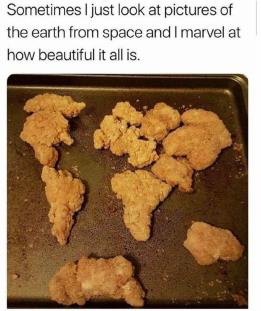

The image features a tray with a variety of fried food items, including several pieces of chicken and a few fish sticks. The chicken pieces are scattered across the tray, with some located towards the center and others towards the edges. The fish sticks are also present on the tray, with one near the center and another towards the right side. The arrangement of the food items creates a visually appealing and appetizing display.


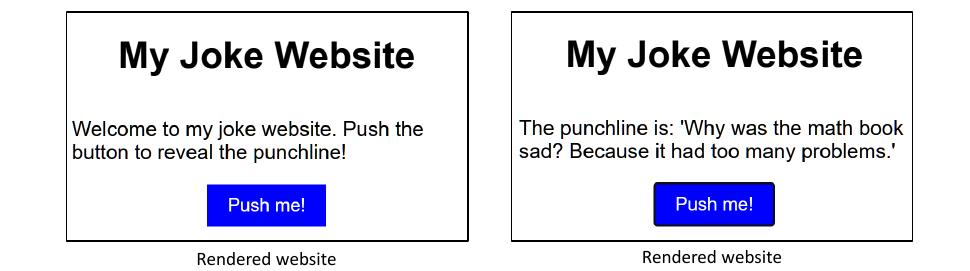

The image consists of two black and white boxes, each containing a statement about a joke website. The statements are written in a similar style, with one box saying "Welcome to my joke website. Push the button to reveal the punchline: The punchline is 'Why was the math book sad? Because it had too many problems.'" The other box has a similar statement, but the punchline is different. The boxes are placed next to each other, creating a visually appealing presentation.


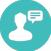

The image features a blue circle with a white head inside it, giving the impression of a person's head. Above the head, there is a speech bubble with text inside it, possibly indicating a conversation or message. The blue circle and the white head create a visually appealing and unique design.


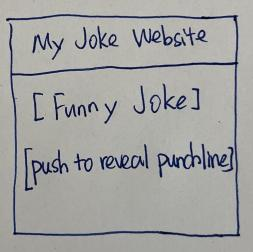

The image features a white sheet of paper with a blue pen, where someone has written "My Joke Website" in the top left corner. Below that, there is a blue pen drawing of a joke box, which is a playful representation of the joke website. The drawing is placed in the center of the paper, with the words "Funny Joke" written below it. The overall presentation gives the impression of a creative and humorous concept for a joke website.


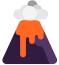

The image features a purple triangle with an orange and white stain on it, resembling a drop of water or a blob of paint. The triangle is placed on a white background, making the orange and white stain stand out. The overall appearance of the image is quite unique and eye-catching.


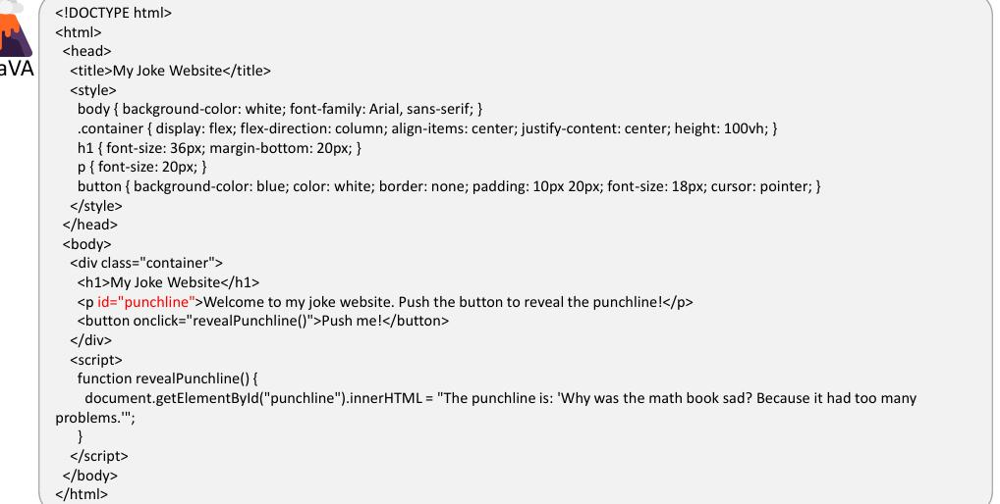

The image displays a computer screen with a lot of text on it. The text appears to be related to a programming language, possibly HTML. The screen is filled with various lines of code, making it difficult to discern the specific details of the code. The text is displayed in a black and white color scheme, which adds to the complexity of the code.


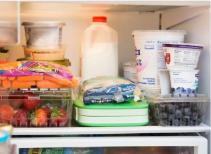

The image displays a refrigerator filled with various food items. There are multiple bottles, including a large bottle of milk, placed on different shelves. Some of the bottles are located on the top shelf, while others are placed on the middle and lower shelves.

In addition to the bottles, there are several bowls and cups scattered throughout the refrigerator. The bowls are placed on different shelves, with some located on the top, middle, and lower sections. The cups can be found on the middle and lower shelves.

A few oranges are also visible in the refrigerator, placed on the middle shelf. The combination of bottles, bowls, cups, and oranges creates a diverse assortment of food items in the refrigerator.


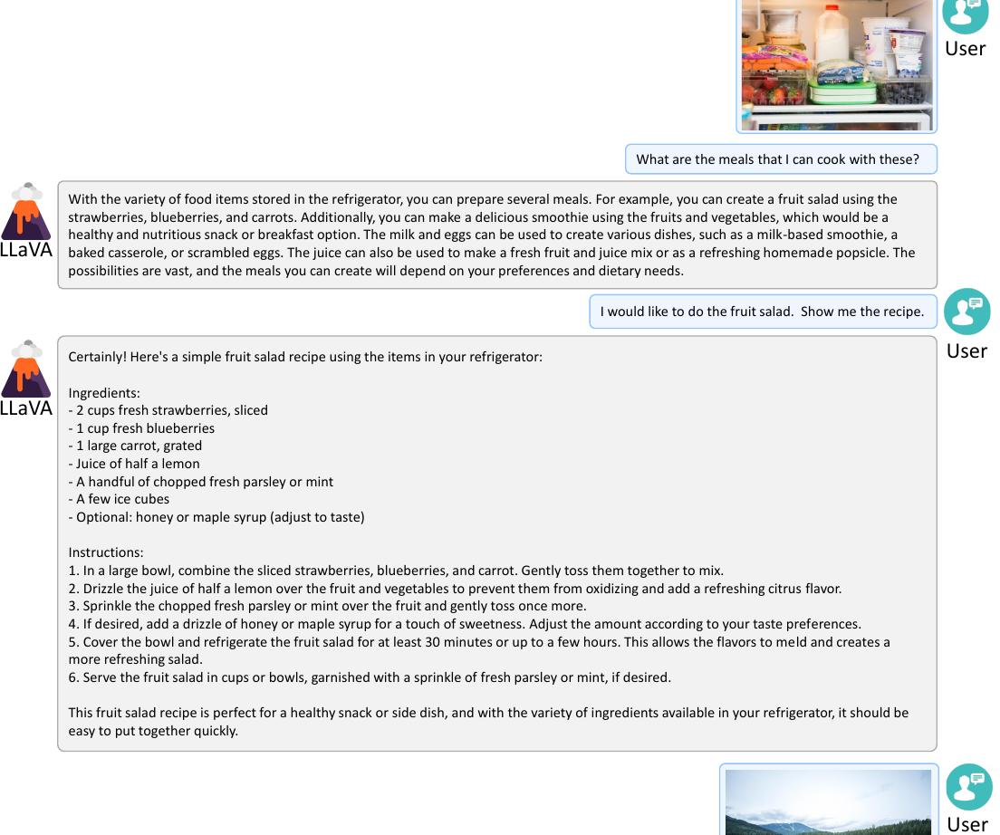

The image features a conversation between two people, with one person asking the other, "What are the meals that I can cook with these?" The other person responds with a list of various food items stored in the refrigerator, including fruits, vegetables, and milk. The conversation is accompanied by a list of ingredients and instructions for preparing a fruit salad.

In addition to the conversation, there is a picture of a refrigerator with a variety of food items displayed, including fruits, vegetables, and milk. The image also includes a recipe for a fruit salad, which is likely the topic of the conversation between the two people.


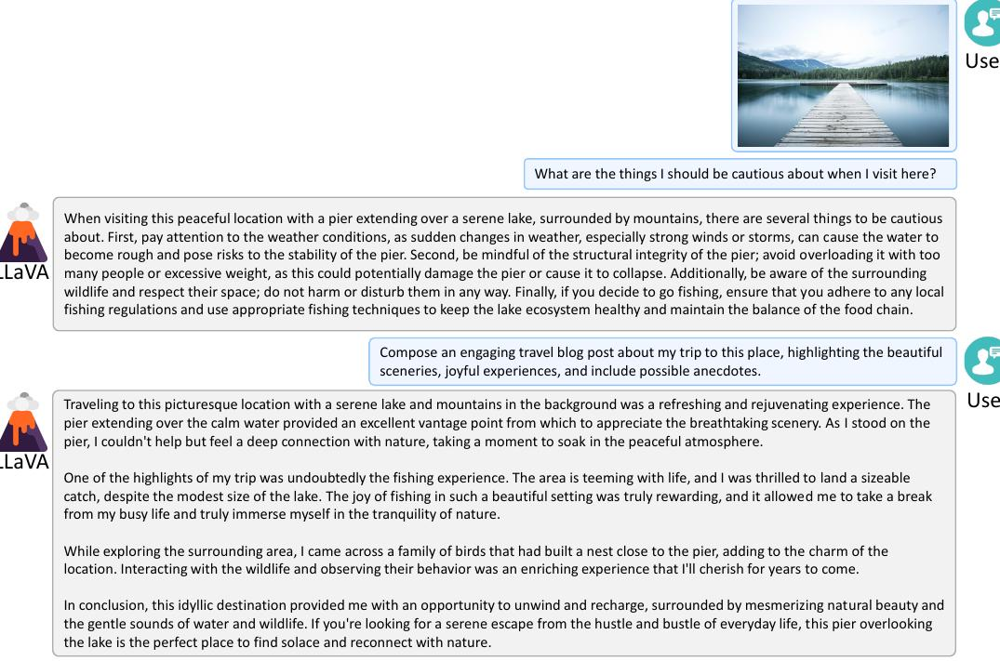

The image features a serene scene of a pier extending over a lake, with mountains in the background. The image is accompanied by a caption that reads, "What are the things I should be cautious about when I visit here?" The caption suggests that the location is picturesque but also warns about potential dangers or precautions one should take. The image is also described as a "beautiful picture" and "a beautiful scene."


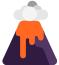

The image features a purple and orange triangle with a large orange drop of liquid on top of it. The triangle is located in the center of the image, and the orange drop is positioned towards the left side of the triangle. The overall composition of the image gives the impression of a colorful and visually appealing design.


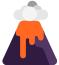

The image features a purple and orange triangle with a large orange drop of liquid, possibly a stain or a blob, on top of it. The triangle is situated in the middle of the scene, and the orange drop appears to be the main focus of the image. The combination of the purple and orange colors creates a visually striking contrast, making the scene stand out.


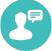

The image features a blue circle with a white outline, which appears to be a symbol or an icon. Inside the circle, there is a small white head, possibly representing a person's head. Above the head, there is a blue speech bubble with a white arrow pointing upwards, indicating a conversation or a message. The combination of the circle, head, and speech bubble creates a visually appealing and engaging design.


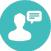

The image features a blue circle with a white head inside it. The head is accompanied by a speech bubble, which contains a message. The circle is placed on a blue background, creating a visually appealing and unique design. The combination of the circle, head, and speech bubble gives the impression of a person's head with a message being conveyed.


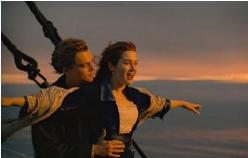

The image features a man and a woman standing next to each other, both with their arms outstretched. They are positioned in front of a beautiful ocean view, enjoying the scenery together. The woman is on the left side of the man, and they both appear to be facing the same direction, possibly looking out at the water. The scene captures a moment of togetherness and appreciation for the natural surroundings.


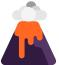

The image features a purple and orange mountain with a large orange drop of liquid, possibly a bubble, on top of it. The orange drop is located towards the center of the mountain, and it appears to be the main focus of the scene. The mountain itself is quite large, occupying most of the image, and the orange drop stands out against the purple background.


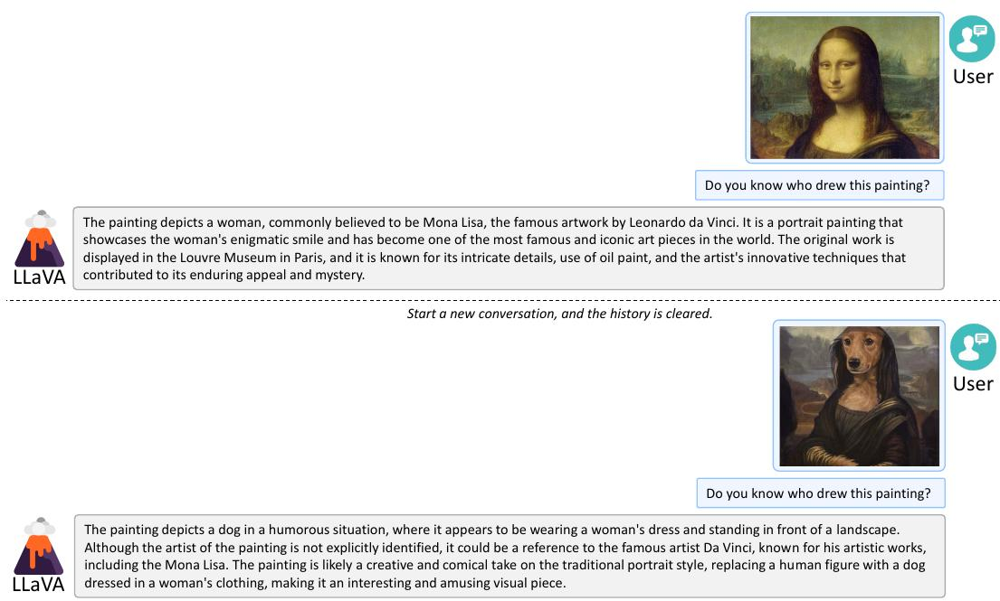

The image features a painting of a woman, which is accompanied by a conversation box on the side. The painting is described as a famous work by Leonardo da Vinci, and the conversation box contains a message asking, "Do you know who drew this painting?" The painting is displayed in a black and white style, which adds to its artistic appeal. The image is a combination of the painting and the conversation box, creating an engaging visual experience.


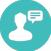

The image features a blue circle with a white head inside it. The head is positioned towards the center of the circle, and it appears to be a close-up of the head. The circle is surrounded by a blue background, giving it a distinctive appearance. The head is the main focus of the image, and it stands out against the blue background.


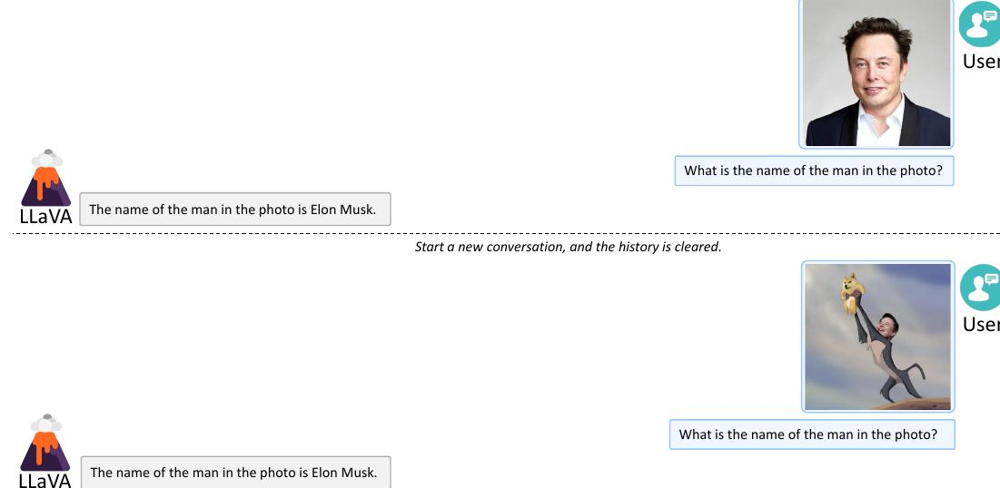

The image consists of two side-by-side images, each featuring a man's face. The first image is a close-up of a man's face, while the second image is a picture of Elon Musk. The two images are accompanied by text boxes, one on each side, which contain a conversation between the two men. The text boxes are placed above the images, with the first text box on the left side and the second text box on the right side. The conversation appears to be about the man in the first image and his connection to Elon Musk.


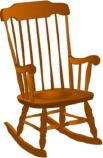

The image features a brown wooden chair with a wooden seat and back. The chair is positioned in the center of the scene, and its back is facing the viewer. The chair appears to be a wooden rocking chair, which is a classic and comfortable seating option. The chair's design and color give it a warm and inviting appearance, making it an ideal choice for relaxation or conversation.


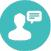

The image features a blue circle with a white headshot inside it. The headshot is a close-up of a person's face, and it appears to be a profile view. The blue circle surrounding the headshot gives the image a unique and visually appealing appearance.


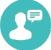

The image features a blue circle with a white head inside it, giving the impression of a person's head. Above the head, there is a blue speech bubble with white text, possibly containing a message or a conversation. The overall design of the image is visually appealing and conveys a sense of communication or interaction.


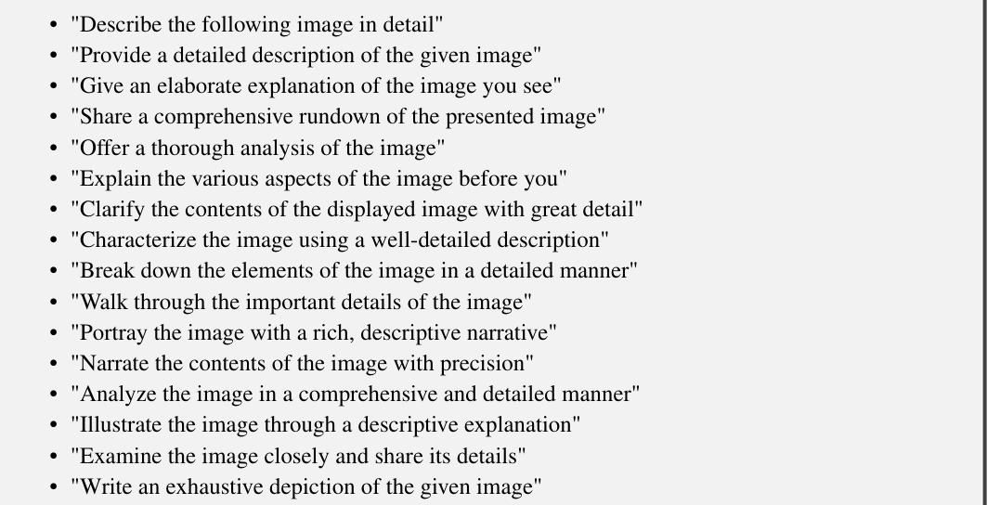

The image depicts a scene where a person is standing in front of a large image, possibly a painting or a poster. The person is positioned in the center of the image, and the large image is displayed prominently behind them. The scene appears to be a visual representation of a person interacting with the artwork, possibly admiring or analyzing it. The image captures the viewer's attention and invites them to explore the artwork further.


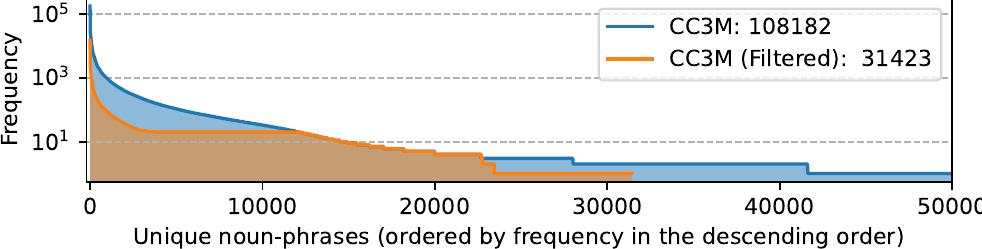

The image displays a white graph with a blue line on it, which is labeled "Frequency." The graph appears to be a representation of a frequency distribution, with the blue line indicating a specific frequency value. The graph is accompanied by a description of the frequency distribution, including the frequency value and the units of measurement. The image also includes a small square box with a number in it, possibly indicating a specific point on the graph or providing additional information about the data.


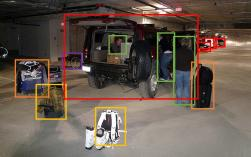

The image features a large truck parked in a garage, surrounded by several people. There are five people in total, with one person standing near the front of the truck, two people standing on the left side, and two people standing on the right side. The truck is parked in a garage with a red square around it, indicating that it is the main focus of the scene.

In addition to the people and the truck, there are several objects scattered throughout the scene. There are three backpacks, one on the left side, one in the middle, and one on the right side of the truck. A suitcase is also present, located on the right side of the truck. A handbag can be seen on the left side of the truck, and a bottle is placed near the center of the scene.


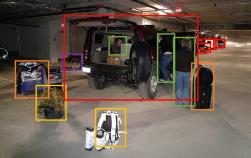

The image features a large truck parked in a garage, with a person standing next to it. The truck is surrounded by several other people, some of whom are standing closer to the truck, while others are positioned further away. There are also a few backpacks and handbags scattered around the scene, with one backpack located near the center of the image and two handbags placed closer to the right side.

In addition to the people and objects, there are a few sports balls placed in the scene, with one located near the center and two others positioned closer to the right side. The presence of these sports balls suggests that the people might be involved in some form of recreational activity or gathering.


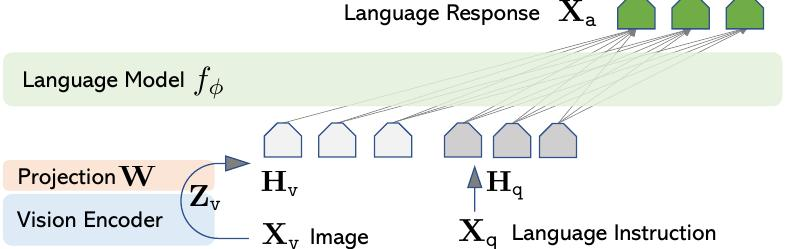

The image displays a diagram with a line labeled "Language Model" and a line labeled "Projection W." Below the lines, there are several small green boxes, each containing a single letter. The boxes are arranged in a way that they appear to be connected to the lines, possibly indicating a relationship between the lines and the boxes. The image seems to be a visual representation of a concept or idea related to language and modeling.


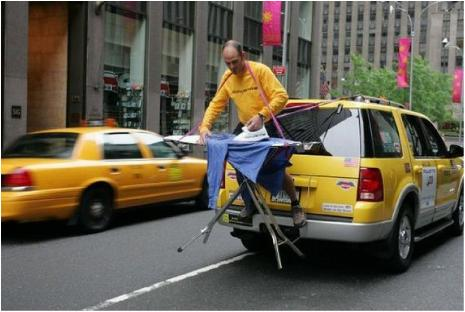

The image features a man standing on the back of a yellow taxi cab, holding a white shirt. The taxi is driving down a street, and the man appears to be hanging out of the back of the vehicle. The scene captures the man's unique and unconventional way of traveling.


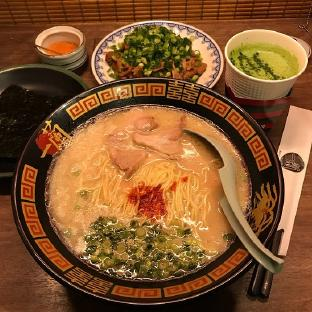

The image features a dining table with a variety of food items displayed on it. There is a bowl of soup, which appears to be the main focus of the meal, accompanied by a spoon placed inside the bowl. A plate of food is also present on the table, along with a cup and a bowl of vegetables.

In addition to the main dishes, there are several bowls and cups scattered around the table, possibly containing other food items or beverages. A knife is also visible on the table, likely used for cutting or serving the food. The table setting creates an inviting atmosphere for a meal shared among friends or family.


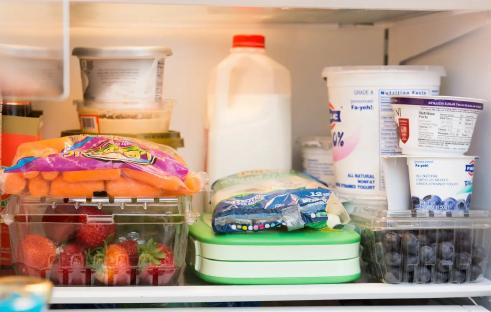

The image features a refrigerator with a variety of food items and containers placed on its shelves. There are several bottles, including a large one on the left side and a smaller one on the right side. A cup is also visible on the right side of the refrigerator.

In addition to the bottles and cup, the refrigerator contains a number of containers, including a bowl and a few cups. There are also several carrots placed on the shelves, with some of them in a bag. The refrigerator appears to be well-stocked with a diverse selection of food items.


In [73]:
from IPython.display import display

for img_dict in img_summaries:
    display(img_dict['image'])
    print(img_dict['summary'])

We see that overall, the descriptions are very precise and correct.

### Index the data in a database (for RAG)

There are several options:
    
- Purely multimodal (for both embedding and retrieval): Encode all data types into the same vector space (using a multimodal embedding generation) for retrieval. Note that this would require that if a text corresponds to the content of an image, their embeddings should be close. This multimodal embedding could be generated using a multimodal model like CLIP. Note that as there is no available easy-to-use 3rd party API to do this (in langchain for example).
    - Using this we directly build a fully multimodal RAG pipeline: from a question, encoding it as a vector, then retrieving the most similar data, whether they are originally (encoded) from images or texts. Once this (possibly multimodal) most similar data is found, it can be ingested into a multimodal LLM, which will then help provide an answer to the initial question. Multimodal models are relatively rare (GPT4), and not natively handled in langchain either.
- Converting all data to textual data: this follows what we have started to do before. For example, we can use LLaVA to convert images to their textual descriptions, and then index all data (text and images) as text representations.
    - a) Then, we could use these embeddings for vector comparison, but still retrieve the data in the database in its original form, i.e. images and text. Unfortunately, this comes back to the problem of the 1st approach as we need a multimodal LLM.
    - b) We could only retrieve textual data in the database, meaning that after doing the vector search, all actual retrieved data would be text, whether it came initially from text or images. **This is the approach we will follow, as it only requires a textual LLM as we've been using until now.** Note that this option might still involve a loss of information due the image --> text transformation.

Function to convert text list into document list:

In [93]:
import uuid
from langchain.schema.document import Document

def get_docs(text_list, ids):
    return [
        Document(
            page_content=s,
            metadata={id_key: ids[i]}
        ) for i, s in enumerate(text_list)
    ]

### Texts
doc_ids = [str(uuid.uuid4()) for _ in text_summaries]
text_docs = get_docs(
    [t['element'] for t in text_summaries],
    doc_ids
    )

summary_text_docs = get_docs(
    [t['text'] for t in text_summaries],
    doc_ids)

### Tables
table_ids = [str(uuid.uuid4()) for _ in table_summaries]
table_docs = get_docs(
    [t['element'] for t in table_summaries],
    table_ids
    )

summary_table_docs = get_docs(
    [t['text'] for t in table_summaries],
    table_ids)

### Images
img_ids = [str(uuid.uuid4()) for _ in img_summaries]
img_summary_docs = get_docs(
    [t['summary'] for t in img_summaries],
    img_ids
    )


In [94]:
from langchain.vectorstores import Chroma
from langchain.storage import InMemoryStore
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain.retrievers.multi_vector import MultiVectorRetriever

vectorstore = Chroma(
    collection_name="llava_pdf",
    embedding_function=OpenAIEmbeddings())

store = InMemoryStore()
id_key = "doc_id"  # key to map vector store to data store

retriever = MultiVectorRetriever(
    vectorstore=vectorstore,
    docstore=store,
    id_key=id_key)

retriever.vectorstore.add_documents(summary_text_docs) # index with the summary of text documents
retriever.docstore.mset(list(zip(doc_ids, text_docs))) # what we retrieve is a full text

retriever.vectorstore.add_documents(summary_table_docs)
retriever.docstore.mset(list(zip(table_ids, table_docs))) # we retrieve the full tables

retriever.vectorstore.add_documents(img_summary_docs)
retriever.docstore.mset(list(zip(img_ids, img_summary_docs))) # we retrieve the summary of the images

In [95]:
retriever.vectorstore.similarity_search('What is specific about LLaVA?')

[Document(metadata={'doc_id': '00512f06-1199-41ca-a6d2-6db41490df0b'}, page_content="The text discusses qualitative results of LLaVA, highlighting its ability to generate code, follow user instructions, and understand visual content. It showcases LLaVA's generalization abilities, such as recognizing Elon Musk in images not covered in training data. The text emphasizes the potential of LLaVA in various applications and calls for further investigation into its emergent behaviors."),
 Document(metadata={}, page_content='The text discusses qualitative results of LLaVA, showcasing its ability to generate code, follow user instructions, and understand visual content. It demonstrates impressive generalization abilities, such as recognizing Elon Musk in images not covered in training data. The potential of LLaVA in various applications is highlighted, with a call for further investigation into its emergent behaviors.'),
 Document(metadata={'doc_id': '11c40574-435b-408e-87eb-e364f649c27e'}, pag

In [96]:
retriever.get_relevant_documents('What is specific about LLaVA?')

[Document(metadata={'doc_id': 'e546790d-f387-4f6a-8f82-df541d7eeee2'}, page_content='B More Results\n\nWe present more qualitative results of LLaVA to analyze its emergent behaviors and observed weaknesses. For more quantitative results of LLaVA on academic benchmarks, please refer to the improved baselines with visual instruction tuning [32]. In Table 9, LLaVA demonstrates a similar behavior as GPT-4 in another example from its paper. Similar to the GPT-4 live demo by OpenAI, LLaVA is capable of generating the HTML/JS/CSS code for an interactive joke website based on a simplified user input sketch in Fig. 2, despite a minor error. As shown in Fig. 3, LLaVA can follow user’s instructions in a conversational style and provide detailed responses or creative writings. Furthermore, LLaVA is able to relate the visual content to the textual knowledge from the pretrained LLM, as demonstrated in Fig. 4 and Fig. 5.\n\nOne interesting emergent behavior of LLaVA is that it is able to understand v

### Setting up the RAG pipeline

In [97]:
from langchain.chains import RetrievalQA
from langchain_openai import ChatOpenAI
from langchain.callbacks import StdOutCallbackHandler

llm = ChatOpenAI(temperature=0)  # deterministic

chain = RetrievalQA.from_chain_type(
    llm=llm,
    retriever=retriever,
    verbose=True
)

chain.run('What makes LLaVA different from GPT-4?')



> Entering new RetrievalQA chain...

> Finished chain.


'LLaVA differs from GPT-4 in its ability to accurately follow user instructions in a multimodal context, such as answering questions about images based on specific prompts. LLaVA provides more comprehensive responses by understanding the scenes and following question instructions, while GPT-4 focuses on describing the image. Additionally, LLaVA can recognize specific individuals like Elon Musk in images, even if they were not part of its training data, suggesting a level of generalization to unseen visual concepts.'

In [98]:
chain.run('What is the architecture of the LLaVA model?')



> Entering new RetrievalQA chain...

> Finished chain.


"I'm not sure about the specific architecture of the LLaVA model."

The LLM should have been able to answer, as in the original article there is a section called "Architecture". This section contains mostly one image to schematize the architecture, which might be the limitation here as we only used a summarized version of it.